In [1]:
import os
import cv2
import copy
import argparse
import insightface
import onnxruntime
import numpy as np
from PIL import Image
from typing import List, Union, Dict, Set, Tuple

In [2]:
def get_face_swap_model(model_path: str):
    model = insightface.model_zoo.get_model(model_path)
    return model


def get_face_analyser(model_path: str, providers,
                    det_size=(320, 320)):
    face_analyser = insightface.app.FaceAnalysis(name="buffalo_l", root="./models/", providers=providers)
    face_analyser.prepare(ctx_id=0, det_size=det_size)
    return face_analyser


def get_one_face(face_analyser,
                 frame:np.ndarray):
    face = face_analyser.get(frame)
    try:
        return min(face, key=lambda x: x.bbox[0])
    except ValueError:
        return None
    

def get_many_faces(face_analyser,
                   frame:np.ndarray):
    """
    get faces from left to right by order
    """
    try:
        face = face_analyser.get(frame)
        return sorted(face, key=lambda x: x.bbox[0])
    except IndexError:
        return None


def swap_face(face_swapper,
              source_faces,
              target_faces,
              source_index,
              target_index,
              temp_frame):
    """
    paste source_face on target image
    """
    source_face = source_faces[source_index]
    target_face = target_faces[target_index]

    return face_swapper.get(temp_frame, target_face, source_face, paste_back=True)

In [3]:
def face_swapping_tool(source_img: Union[Image.Image, List],
            target_img: Image.Image,
            source_indexes: str,
            target_indexes: str,
            model: str):
    # load machine default available providers
    providers = onnxruntime.get_available_providers()

    # load face_analyser
    face_analyser = get_face_analyser(model, providers)
    
    # load face_swapper
    model_path = os.path.join('./models/', model)
    face_swapper = get_face_swap_model(model_path)
    
    # read target image
    target_img = cv2.cvtColor(np.array(target_img), cv2.COLOR_RGB2BGR)
    
    # detect faces that will be replaced in the target image
    target_faces = get_many_faces(face_analyser, target_img)
    num_target_faces = len(target_faces)
    num_source_images = len(source_img)

    if target_faces is not None:
        temp_frame = copy.deepcopy(target_img)
        if isinstance(source_img, list) and num_source_images == num_target_faces:
            print("Replacing faces in target image from the left to the right by order")
            for i in range(num_target_faces):
                source_faces = get_many_faces(face_analyser, cv2.cvtColor(np.array(source_img[i]), cv2.COLOR_RGB2BGR))
                source_index = i
                target_index = i

                if source_faces is None:
                    raise Exception("No source faces found!")

                temp_frame = swap_face(
                    face_swapper,
                    source_faces,
                    target_faces,
                    source_index,
                    target_index,
                    temp_frame
                )
        elif num_source_images == 1:
            # detect source faces that will be replaced into the target image
            source_faces = get_many_faces(face_analyser, cv2.cvtColor(np.array(source_img[0]), cv2.COLOR_RGB2BGR))
            num_source_faces = len(source_faces)
            print(f"Source faces: {num_source_faces}")
            print(f"Target faces: {num_target_faces}")

            if source_faces is None:
                raise Exception("No source faces found!")

            if target_indexes == "-1":
                if num_source_faces == 1:
                    print("Replacing all faces in target image with the same face from the source image")
                    num_iterations = num_target_faces
                elif num_source_faces < num_target_faces:
                    print("There are less faces in the source image than the target image, replacing as many as we can")
                    num_iterations = num_source_faces
                elif num_target_faces < num_source_faces:
                    print("There are less faces in the target image than the source image, replacing as many as we can")
                    num_iterations = num_target_faces
                else:
                    print("Replacing all faces in the target image with the faces from the source image")
                    num_iterations = num_target_faces

                for i in range(num_iterations):
                    source_index = 0 if num_source_faces == 1 else i
                    target_index = i

                    temp_frame = swap_face(
                        face_swapper,
                        source_faces,
                        target_faces,
                        source_index,
                        target_index,
                        temp_frame
                    )
            else:
                print("Replacing specific face(s) in the target image with specific face(s) from the source image")

                if source_indexes == "-1":
                    source_indexes = ','.join(map(lambda x: str(x), range(num_source_faces)))

                if target_indexes == "-1":
                    target_indexes = ','.join(map(lambda x: str(x), range(num_target_faces)))

                source_indexes = source_indexes.split(',')
                target_indexes = target_indexes.split(',')
                num_source_faces_to_swap = len(source_indexes)
                num_target_faces_to_swap = len(target_indexes)

                if num_source_faces_to_swap > num_source_faces:
                    raise Exception("Number of source indexes is greater than the number of faces in the source image")

                if num_target_faces_to_swap > num_target_faces:
                    raise Exception("Number of target indexes is greater than the number of faces in the target image")

                if num_source_faces_to_swap > num_target_faces_to_swap:
                    num_iterations = num_source_faces_to_swap
                else:
                    num_iterations = num_target_faces_to_swap

                if num_source_faces_to_swap == num_target_faces_to_swap:
                    for index in range(num_iterations):
                        source_index = int(source_indexes[index])
                        target_index = int(target_indexes[index])

                        if source_index > num_source_faces-1:
                            raise ValueError(f"Source index {source_index} is higher than the number of faces in the source image")

                        if target_index > num_target_faces-1:
                            raise ValueError(f"Target index {target_index} is higher than the number of faces in the target image")

                        temp_frame = swap_face(
                            face_swapper,
                            source_faces,
                            target_faces,
                            source_index,
                            target_index,
                            temp_frame
                        )
        else:
            raise Exception("Unsupported face configuration")
        result = temp_frame
    else:
        print("No target faces found!")
    
    result_image = Image.fromarray(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
    return result_image

In [4]:
target_img = np.asarray(Image.open('tmp.jpg'))
source_img = np.asarray(Image.open('tmp2.jpg'))

In [5]:
model = "inswapper_128.onnx"
result_image = process([source_img], target_img, -1, -1, model)

EP Error /onnxruntime_src/onnxruntime/core/session/provider_bridge_ort.cc:1193 onnxruntime::Provider& onnxruntime::ProviderLibrary::Get() [ONNXRuntimeError] : 1 : FAIL : Failed to load library libonnxruntime_providers_tensorrt.so with error: libcudnn.so.8: cannot open shared object file: No such file or directory
 when using ['TensorrtExecutionProvider', 'CUDAExecutionProvider', 'AzureExecutionProvider', 'CPUExecutionProvider']
Falling back to ['CUDAExecutionProvider', 'CPUExecutionProvider'] and retrying.
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: ./models/models/buffalo_l/1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
EP Error /onnxruntime_src/onnxruntime/core/session/provider_bridge_ort.cc:1193 onnxruntime::Provider& onnxruntime::ProviderLibrary::Get() [ONNXRuntimeError] : 1 : FAIL : Failed to load library libonnxruntime_providers_tensorrt.so with error: libcudnn.so.8: cannot open shared object file: No such file or 

2023-11-19 01:04:08.790641537 [E:onnxruntime:Default, provider_bridge_ort.cc:1480 TryGetProviderInfo_CUDA] /onnxruntime_src/onnxruntime/core/session/provider_bridge_ort.cc:1193 onnxruntime::Provider& onnxruntime::ProviderLibrary::Get() [ONNXRuntimeError] : 1 : FAIL : Failed to load library libonnxruntime_providers_cuda.so with error: libcublasLt.so.11: cannot open shared object file: No such file or directory

2023-11-19 01:04:09.279999504 [E:onnxruntime:Default, provider_bridge_ort.cc:1480 TryGetProviderInfo_CUDA] /onnxruntime_src/onnxruntime/core/session/provider_bridge_ort.cc:1193 onnxruntime::Provider& onnxruntime::ProviderLibrary::Get() [ONNXRuntimeError] : 1 : FAIL : Failed to load library libonnxruntime_providers_cuda.so with error: libcublasLt.so.11: cannot open shared object file: No such file or directory

2023-11-19 01:04:09.308471421 [E:onnxruntime:Default, provider_bridge_ort.cc:1480 TryGetProviderInfo_CUDA] /onnxruntime_src/onnxruntime/core/session/provider_bridge_ort.cc:

Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: ./models/models/buffalo_l/det_10g.onnx detection [1, 3, '?', '?'] 127.5 128.0
EP Error /onnxruntime_src/onnxruntime/core/session/provider_bridge_ort.cc:1193 onnxruntime::Provider& onnxruntime::ProviderLibrary::Get() [ONNXRuntimeError] : 1 : FAIL : Failed to load library libonnxruntime_providers_tensorrt.so with error: libcudnn.so.8: cannot open shared object file: No such file or directory
 when using ['TensorrtExecutionProvider', 'CUDAExecutionProvider', 'AzureExecutionProvider', 'CPUExecutionProvider']
Falling back to ['CUDAExecutionProvider', 'CPUExecutionProvider'] and retrying.
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: ./models/models/buffalo_l/genderage.onnx genderage ['None', 3, 96, 96] 0.0 1.0
EP Error /onnxruntime_src/onnxruntime/core/session/provider_bridge_ort.cc:1193 onnxruntime::Provider& onnxruntime::ProviderLibrary:

2023-11-19 01:04:09.354218505 [E:onnxruntime:Default, provider_bridge_ort.cc:1480 TryGetProviderInfo_CUDA] /onnxruntime_src/onnxruntime/core/session/provider_bridge_ort.cc:1193 onnxruntime::Provider& onnxruntime::ProviderLibrary::Get() [ONNXRuntimeError] : 1 : FAIL : Failed to load library libonnxruntime_providers_cuda.so with error: libcublasLt.so.11: cannot open shared object file: No such file or directory

2023-11-19 01:04:09.517737913 [E:onnxruntime:Default, provider_bridge_ort.cc:1480 TryGetProviderInfo_CUDA] /onnxruntime_src/onnxruntime/core/session/provider_bridge_ort.cc:1193 onnxruntime::Provider& onnxruntime::ProviderLibrary::Get() [ONNXRuntimeError] : 1 : FAIL : Failed to load library libonnxruntime_providers_cuda.so with error: libcublasLt.so.11: cannot open shared object file: No such file or directory



Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: ./models/models/buffalo_l/w600k_r50.onnx recognition ['None', 3, 112, 112] 127.5 127.5
set det-size: (320, 320)


2023-11-19 01:04:10.239262479 [E:onnxruntime:Default, provider_bridge_ort.cc:1480 TryGetProviderInfo_CUDA] /onnxruntime_src/onnxruntime/core/session/provider_bridge_ort.cc:1193 onnxruntime::Provider& onnxruntime::ProviderLibrary::Get() [ONNXRuntimeError] : 1 : FAIL : Failed to load library libonnxruntime_providers_cuda.so with error: libcublasLt.so.11: cannot open shared object file: No such file or directory



Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
inswapper-shape: [1, 3, 128, 128]
Replacing faces in target image from the left to the right by order


/home/slvt/miniconda3/envs/sd/lib/python3.10/site-packages/insightface/utils/transform.py:68: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  P = np.linalg.lstsq(X_homo, Y)[0].T # Affine matrix. 3 x 4


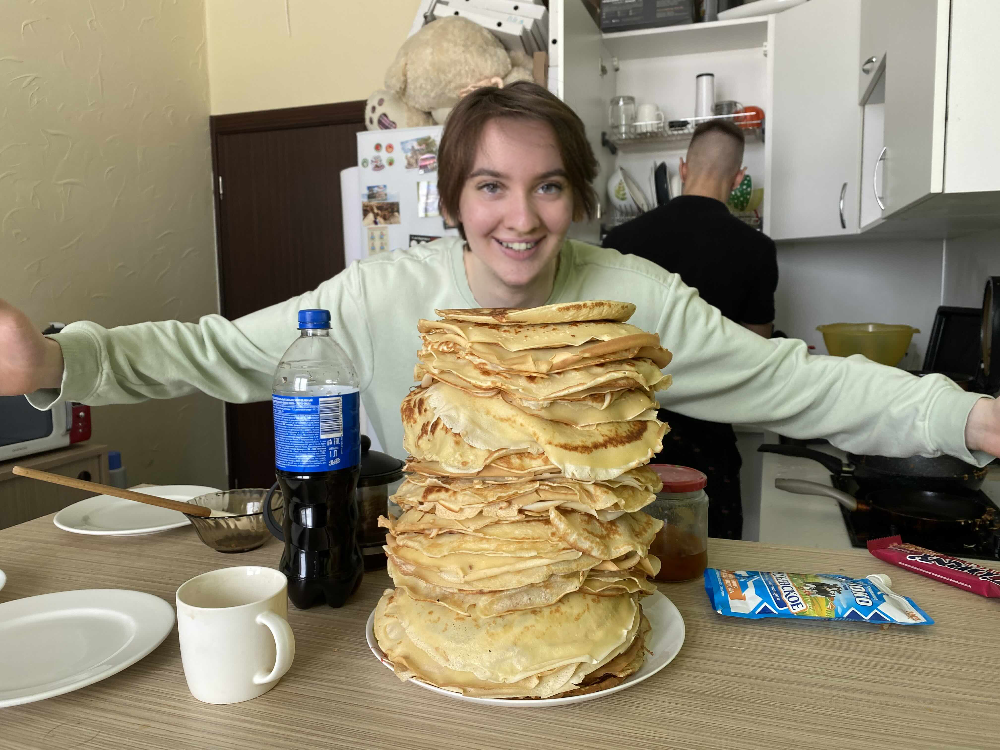

In [6]:
result_image

In [7]:
import numpy as np
from modules.restoration import *

/home/slvt/miniconda3/envs/sd/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/slvt/miniconda3/envs/sd/lib/python3.10/site-packages/torchvision/transforms/functional_tensor.py:5: UserWarning: The torchvision.transforms.functional_tensor module is deprecated in 0.15 and will be **removed in 0.17**. Please don't rely on it. You probably just need to use APIs in torchvision.transforms.functional or in torchvision.transforms.v2.functional.
  warnings.warn(


In [8]:
check_ckpts()

In [9]:
upsampler = set_realesrgan()

In [10]:
device = torch.device("mps" if torch.backends.mps.is_available() else "cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [11]:
ARCH_REGISTRY.keys()

dict_keys([])

In [12]:
from CodeFormer.CodeFormer.basicsr.archs.codeformer_arch import CodeFormer

In [13]:
# codeformer_net = ARCH_REGISTRY.get("CodeFormer")(dim_embd=512,
#                                                  codebook_size=1024,
#                                                  n_head=8,
#                                                  n_layers=9,
#                                                  connect_list=[
#                                                      "32", "64", "128", "256"],
#                                                  ).to(device)

codeformer_net = CodeFormer(dim_embd=512,
                            codebook_size=1024,
                            n_head=8,
                            n_layers=9,
                            connect_list=[
                                "32", "64", "128", "256"],
                            ).to(device)

In [14]:
ckpt_path = "CodeFormer/CodeFormer/weights/CodeFormer/codeformer.pth"

checkpoint = torch.load(ckpt_path)["params_ema"]
codeformer_net.load_state_dict(checkpoint)
codeformer_net.eval()
result_image = cv2.cvtColor(np.array(result_image), cv2.COLOR_RGB2BGR)

In [15]:
result_image = face_restoration(result_image,
                                True,
                                True,
                                1,
                                0.5,
                                upsampler,
                                codeformer_net,
                                device)

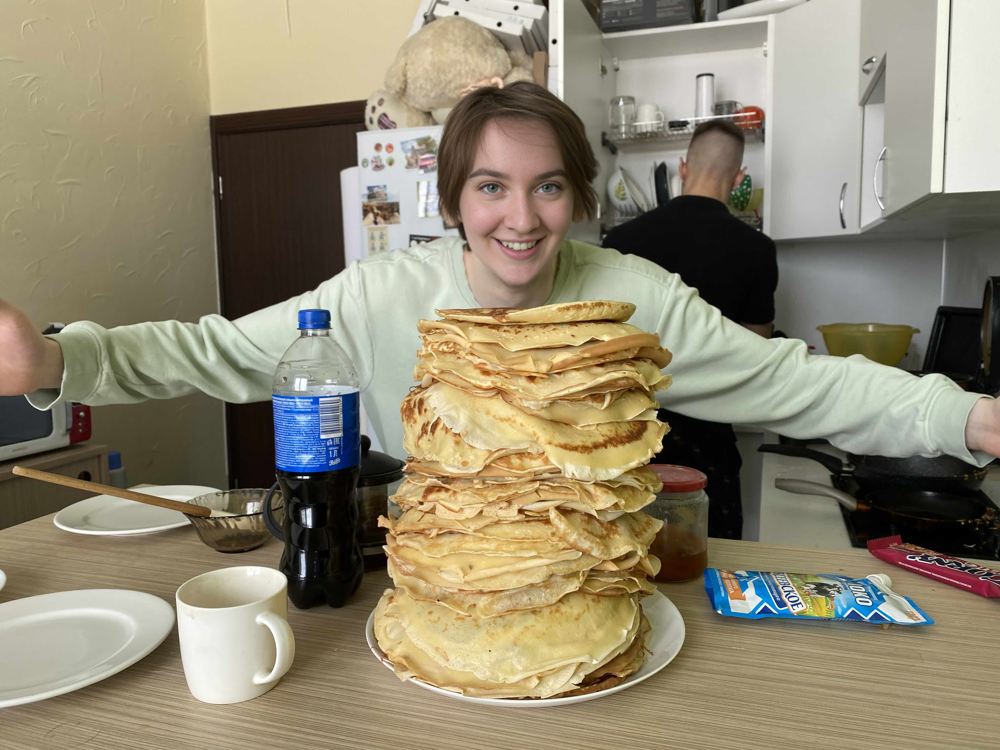

In [16]:
result_image = Image.fromarray(result_image)
result_image